In [1]:
# !pip install pillow

In [2]:
# !pip install seaborn

In [3]:
# !pip install scikit-image

In [4]:
# !pip install albumentations


In [5]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

print('슝=3')

슝=3


In [6]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
  if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

In [7]:
dir_path = os.getenv('HOME') + '/segmentation/data/training'
dir_path

'/aiffel/segmentation/data/training'

In [12]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'
# dir_path = os.getenv('HOME') + '/Segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))


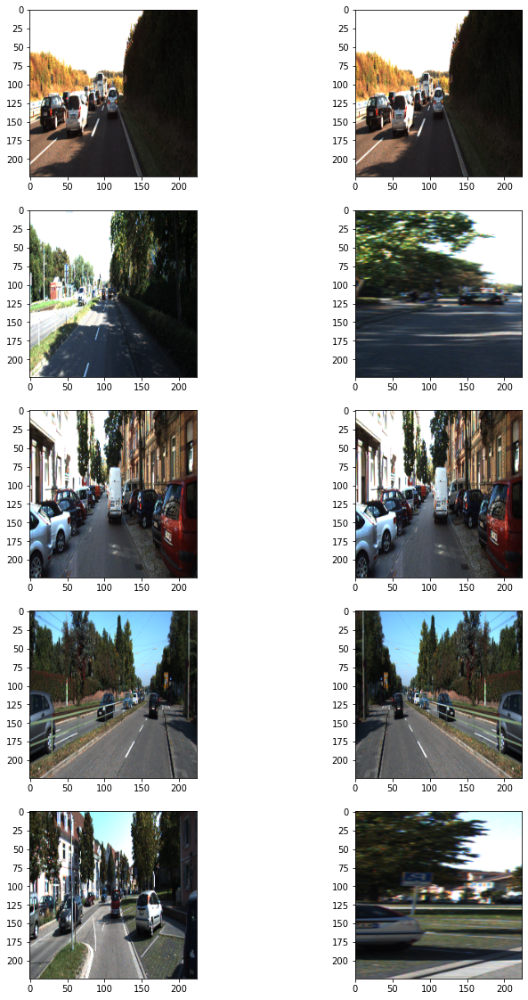

In [13]:

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [14]:
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
    # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]
    
  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])
        
    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
      return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

In [15]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

In [21]:
# import os

# os.environ["TPU_NAME"]="node-4" # your instance name
os.environ["TPU_NAME"]=""
# os.environ["TPU_LOAD_LIBRARY"]="0" # if you use more than 8 cores - it means you use "pods"
TPU_PATH = os.environ["TPU_NAME"]


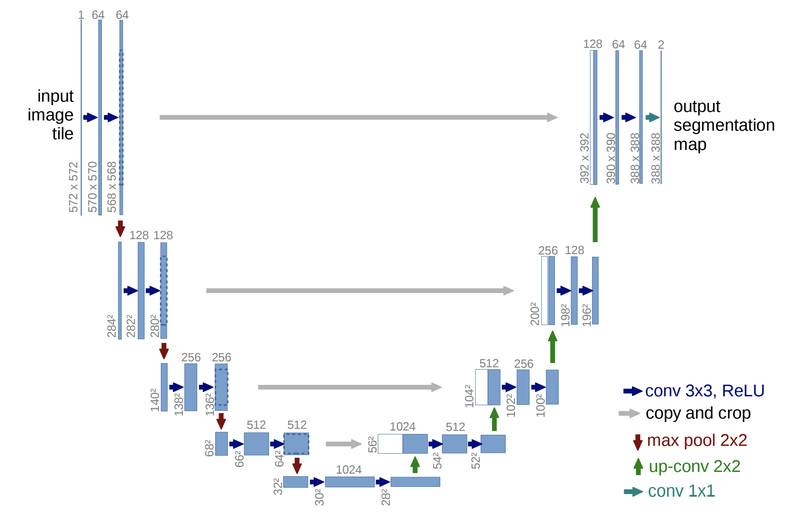

In [18]:
def build_model(input_shape=(224, 224, 3)):
    
    # TODO: input_shape에 따라 U-Net을 만들어주세요
    # 이때 model은 fully convolutional해야 합니다.
    inputs = Input(input_shape)
      #Contracting Path
    conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool4)  
    conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv5)

    #Expanding Path
    drop5 = Dropout(0.5)(conv5)
    up6 = Conv2DTranspose(512, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(drop5)
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv6)
    up7 = Conv2DTranspose(256, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv6)
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv7)
    up8 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv7)
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv8)
    up9 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv8)
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)  
    conv9 = Conv2D(2, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)     
    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)
    model = Model(inputs = inputs, outputs = conv10)
    
    return model

In [23]:
# Core code to use TPU
tf.keras.backend.clear_session()

model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'
# model_path = os.getenv('HOME') + '/Segmentation/seg_model_unet.h5'

if TPU_PATH is not "" : 
    cluster_resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu=TPU_PATH)
    print(cluster_resolver)
    tf.config.experimental_connect_to_cluster(cluster_resolver)
    tf.tpu.experimental.initialize_tpu_system(cluster_resolver)
    strategy = tf.distribute.TPUStrategy(cluster_resolver)

    # All of the model state in this part 
    with strategy.scope():
        model = build_model()
        print(model.summary())
        model.compile(optimizer = Adam(1e-4), 
                      loss = 'binary_crossentropy'
                      )
else :
    model = build_model()
    print(model.summary())
    model.compile(optimizer = Adam(1e-4), 
                  loss = 'binary_crossentropy',
                  metrics = ['accuracy']
                  )


<>:7: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:7: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/tmp/ipykernel_79/185672663.py:7: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if TPU_PATH is not "" :


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [25]:
history = model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
 )

model.save(model_path)  #학습한 모델을 저장해 주세요.

Epoch 1/100
11/11 [==============================] - 7s 587ms/step - loss: 0.0268 - val_loss: 0.0238
Epoch 2/100
11/11 [==============================] - 7s 595ms/step - loss: 0.0196 - val_loss: 0.0254
Epoch 3/100
11/11 [==============================] - 7s 602ms/step - loss: 0.0203 - val_loss: 0.0231
Epoch 4/100
11/11 [==============================] - 7s 630ms/step - loss: 0.0189 - val_loss: 0.0206
Epoch 5/100
11/11 [==============================] - 7s 608ms/step - loss: 0.0161 - val_loss: 0.0196
Epoch 6/100
11/11 [==============================] - 7s 600ms/step - loss: 0.0182 - val_loss: 0.0232
Epoch 7/100
11/11 [==============================] - 7s 595ms/step - loss: 0.0155 - val_loss: 0.0199
Epoch 8/100
11/11 [==============================] - 7s 598ms/step - loss: 0.0400 - val_loss: 0.0307
Epoch 9/100
11/11 [==============================] - 7s 596ms/step - loss: 0.0239 - val_loss: 0.0285
Epoch 10/100
11/11 [==============================] - 6s 591ms/step - loss: 0.0211 - val_lo

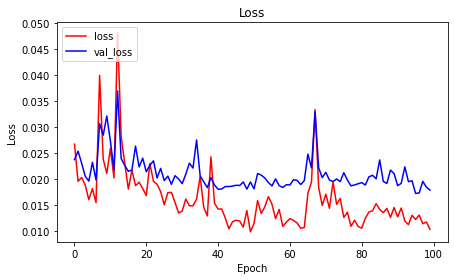

In [28]:
plt.subplots(figsize=(12,4))

# Model Loss, Validation Loss 시각화
plt.subplot(121)
plt.plot(history.history['loss'], 'r')
plt.plot(history.history['val_loss'], 'b')
plt.title(f'Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper left')

plt.tight_layout()
plt.savefig(os.path.join('./', f'unet_baseline_result.png'))
plt.show()

In [ ]:
def plot_history(history, model_name='U-Net'):
    plt.subplots(figsize=(12,4))

    # Model Loss, Validation Loss 시각화
    plt.subplot(121)
    plt.plot(history.history['loss'], 'r')
    plt.plot(history.history['val_loss'], 'b')
    plt.title(f'{model_name} Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['loss', 'val_loss'], loc='upper left')

    # Model Accuracy, Validation Accuracy 시각화
    plt.subplot(122)
    plt.plot(history.history['accuracy'], 'r')
    plt.plot(history.history['val_accuracy'], 'b')
    plt.title(f'{model_name} Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['accuracy', 'val_accuracy'], loc='upper left')

    plt.tight_layout()
    plt.savefig(os.path.join(DATA_DIR, f'{model_name}_Result.png'))  # 저장
    plt.show()

In [29]:
# 미리 준비한 모델을 불러오려면 아래 주석을 해제하세요
# model_path = dir_path + '/seg_model_unet.h5' 

model = tf.keras.models.load_model(model_path)

In [30]:
def get_output(model, preproc, image_path, output_path):
     origin_img = imread(image_path)
     data = {"image":origin_img}
     processed = preproc(**data)
     output = model(np.expand_dims(processed["image"]/255,axis=0))
     output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
     output = Image.fromarray(output)
     background = Image.fromarray(origin_img).convert('RGBA')
     output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
     output = Image.blend(background, output, alpha=0.5)
     output.show()
     return output

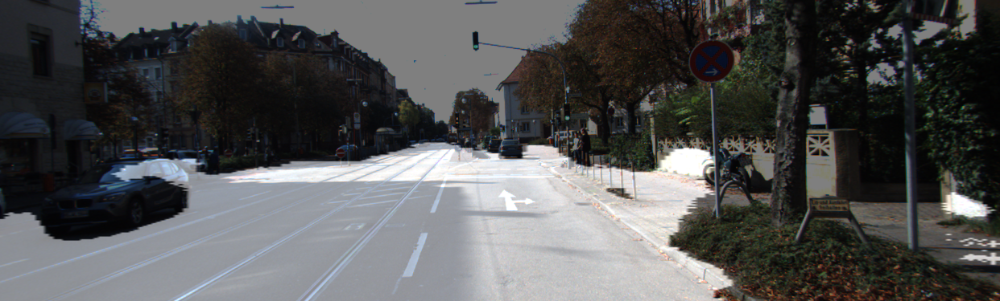

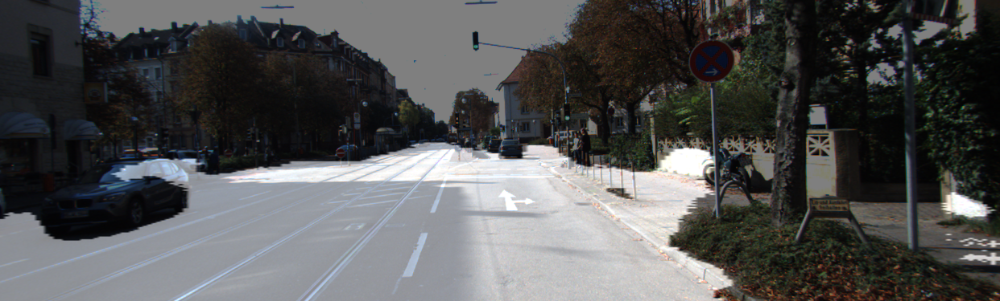

In [31]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

In [35]:
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = float(np.sum(intersection)) / float(np.sum(union)) # iou 스코어를 구하되 결과값을 float로 만들어주세요!
    print('IoU : %f' % iou_score )
    return iou_score

In [36]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

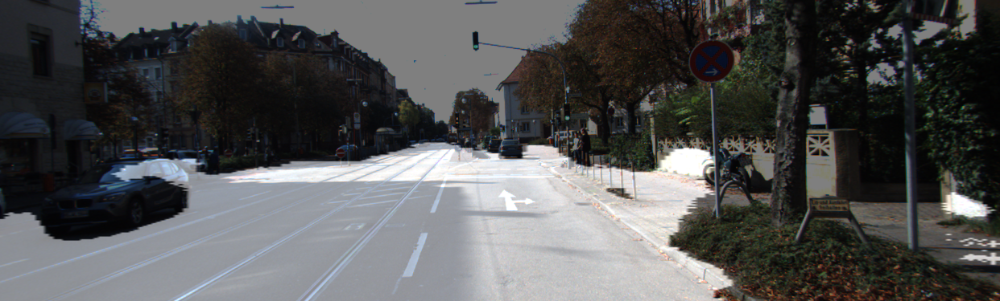

IoU : 0.826536


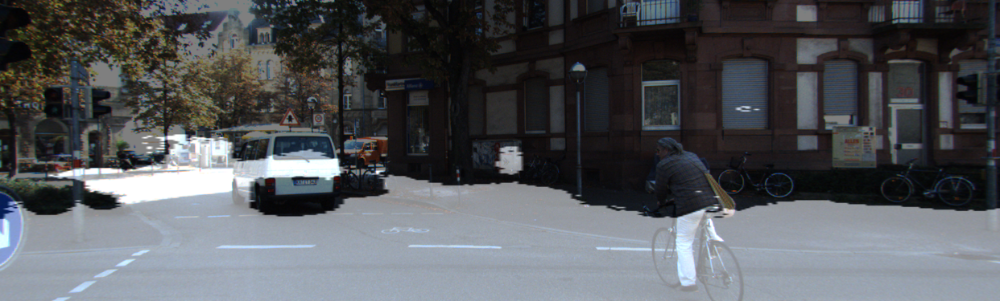

IoU : 0.620738


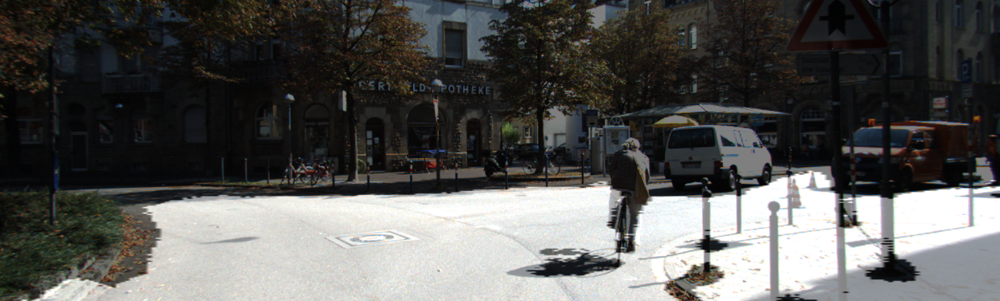

IoU : 0.576771


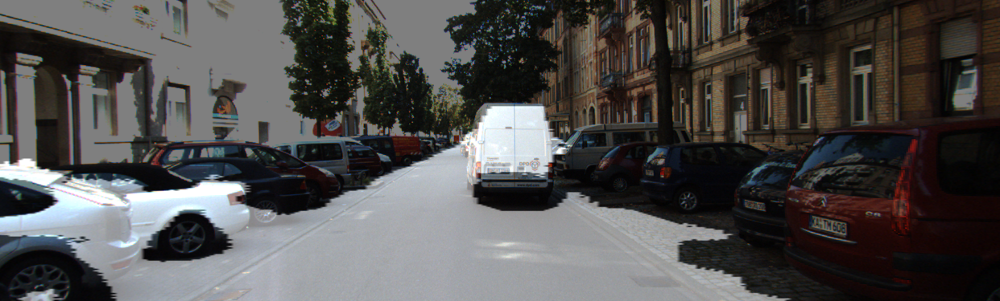

IoU : 0.510544


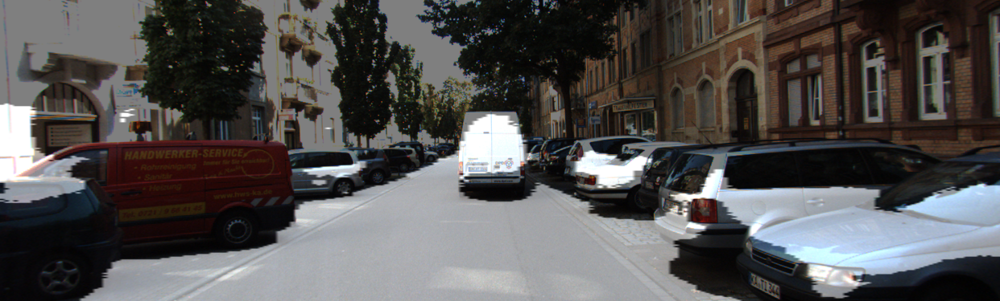

IoU : 0.439930


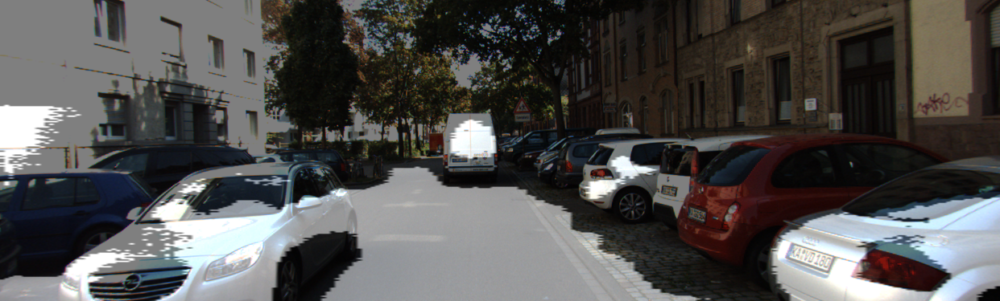

IoU : 0.365565


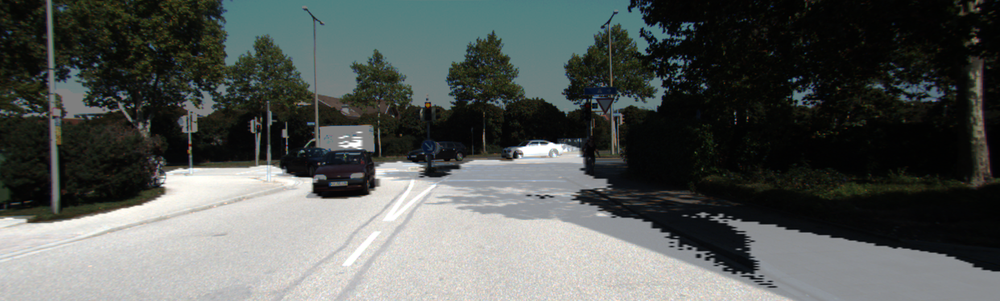

IoU : 0.738088


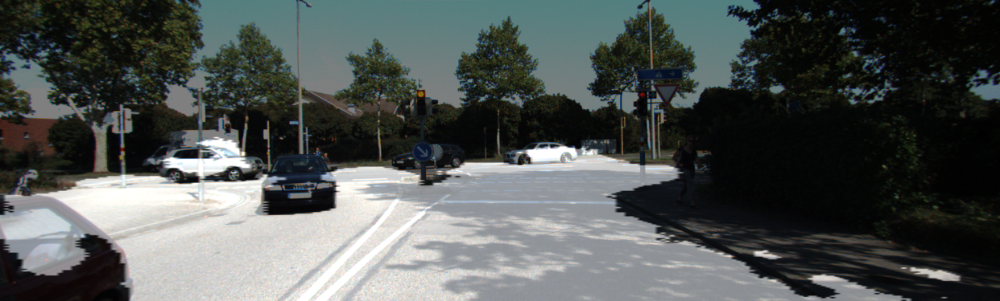

IoU : 0.755265


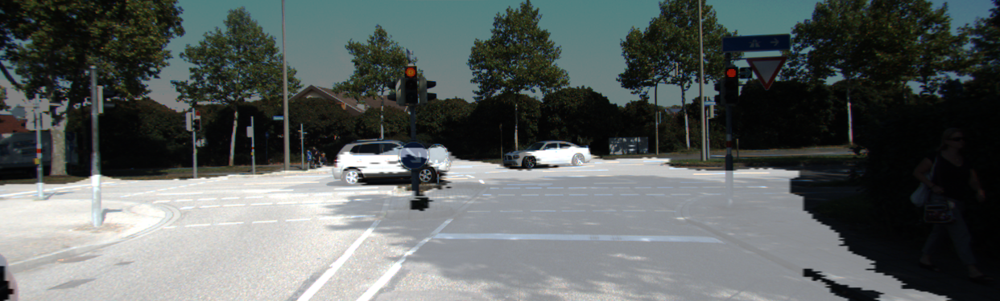

IoU : 0.735057


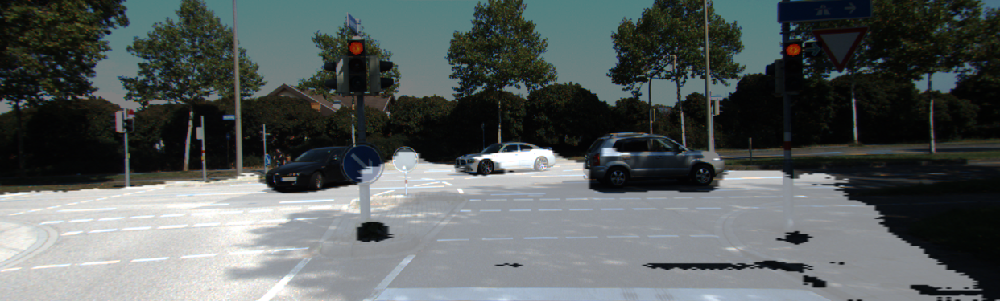

IoU : 0.699596


In [39]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
# i = 2    # i값을 바꾸면 테스트용 파일이 달라집니다. 
for i in range(1, 11):
    output, prediction, target = get_output(
         model, 
         test_preproc,
         image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
         output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
         label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
     )

    calculate_iou_score(target, prediction)

# 프로젝트 : 개선된 U-Net 모델 만들기
U-Net을 통한 시맨틱 세그멘테이션 결과가 충분히 만족스러우신가요? 어느 정도 동작하는 것 같긴 하지만 좀 더 개선할 여지도 보일 것입니다.

2018년에 U-Net++라는 논문이 나왔습니다. 이 논문은 기존에 아주 단순하면서도 세그멘테이션에서 효과를 발휘했던 U-Net의 네트워크 구조에 DenseNet의 아이디어를 가미하여 성능을 개선한 모델입니다. 논문은 2020년에 한 번 업그레이드가 되었네요.

U-Net++: v1
U-Net++: v2
모델의 구조 자체는 아래 그림에서 보는 것처럼 별다른 설명이 없이도 직관적으로 이해가 가능한 수준입니다. 오늘 소개되었던 U-Net의 모델 코드를 조금만 수정 확장하면 충분히 구현할 수 있을 것입니다. 그래서 오늘의 과제는 바로 U-Net++ 모델을 스스로의 힘으로 직접 구현해 보고, U-Net을 활용했던 도로 세그멘테이션 태스크에 적용하여 U-Net을 썼을 때보다 성능이 향상되었음을 확인해 보는 것입니다. 정성적으로는 두 모델의 세그멘테이션 결과를 시각화해서 비교해 볼 수 있을 것이고, 정량적으로는 동일 이미지에 대한 IoU 값을 비교해 보면 될 것입니다.

content img
참고할 수 있는 코드는 아래에 있습니다. 다행히도 keras로 구현되어 있습니다.

U-Net++:Github
코드 중에서 가장 중요한 부분도 알려드리자면 여기:build_xnet입니다. 논문에서 제시하는 수식과 함께 참고하세요.

content img
[H와 u와 []가 무엇인지 주목하세요]
https://arxiv.org/pdf/1807.10165.pdf
코드 중 up_block으로는 두 가지 방식을 사용하고 있네요. Transpose2D_block과 Upsample2D_block인데요. 둘 중 어느 것을 사용해도 좋습니다.

또 한 가지 주의해야 할 점은 Loss를 조금 다르게 구현해야 한다는 점입니다. binary cross-entropy와 dice coefficient를 사용한다고 하는데요. dice_coef에 구현된 dice coefficient를 참고해 보세요.

content img
[binary cross-entropy와 dice coefficient를 이용합니다]
https://arxiv.org/pdf/1807.10165.pdf
프로젝트 진행에 필요한 주요 라이브러리 버전 체크를 해봅시다.

In [44]:
# 필요한 라이브러리를 로드합니다. 
import os
import math
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import plot_model

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

from albumentations import HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize


# Step 1. KITTI 데이터셋 수집과 구축
다운로드한 KITTI 데이터에 data augmentation을 적용한 형태로 데이터셋을 구축합니다. 이때 주의할 점이 있습니다. U-Net++는 메모리 사용량이 U-Net보다 꽤 많아집니다. 그러니 배치 사이즈를 적절히 줄여서 설정하시기를 권합니다.

In [43]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [45]:
BATCH_SIZE = 8

augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
    batch_size=BATCH_SIZE
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False,
    batch_size=BATCH_SIZE
)

# Step 2. U-Net++ 모델의 구현
U-Net의 모델 구조와 소스코드를 면밀히 비교해 보다 보면, U-Net++를 어떻게 구현할 수 있을지에 대한 방안을 떠올릴 수 있을 것입니다. 이 과정을 통해 U-Net 자체에 대한 이해도도 증진될 것입니다. 그 외 적절히 U-Net의 백본 구조, 기타 파라미터 변경 등을 통해 추가적인 성능 향상이 가능할 수도 있습니다.

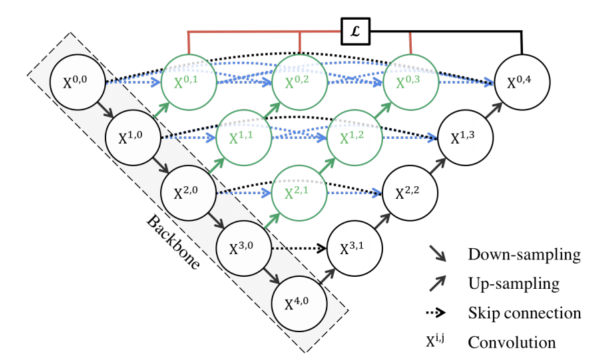

- 핵심 : Dense하게 Skip-connection하는 것과 Loss function인 것 같다.
- 구현에 대한 감이 전혀 오지 않아서, [해당 코드](https://github.com/HRPzz/AIFFEL/blob/main/GOING_DEEPER_CV/Node_10/%5BCV-10%5D%20U-Net_vs_U-Net-pp_in_Semantic_Segmentation.ipynb)를 참고하여 이해를 하였다. 
- 확인을 해 보니, 나이브하게 함수형으로 진행 시 구현상의 복잡도가 너무 커서, block을 정의해야만 한다.

In [47]:
# convolution block 정의
def conv_block(dim, x, skip_conn_list=[], up_concat=False, down_pool=False):
    
    if up_concat:
        x = Conv2DTranspose(dim, 2,  activation='relu', strides=(2, 2),
                           kernel_initializer='he_normal')(x)
        skip_conn_list.append(x)
        x = concatenate(skip_conn_list, axis=3)
    
    x = Conv2D(dim, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
    x = Conv2D(dim, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
    
    if down_pool:
        x = MaxPooling2D(pool_size=(2,2))(x)
    
    return x

In [48]:
def get_output(x):
    x = Conv2D(2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
    x = Conv2D(1, 1, activation='sigmoid')(x)
    return x

In [49]:
def build_unet_pp(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)
    
    filter_list = [64, 128, 256, 512, 1024]
    
    x_00 = conv_block(filter_list[0], inputs)
    x_10 = conv_block(filter_list[1], x_00, down_pool=True)
    x_20 = conv_block(filter_list[2], x_10, down_pool=True)
    x_30 = conv_block(filter_list[3], x_20, down_pool=True)
    x_40 = conv_block(filter_list[4], x_30, down_pool=True)
    
    x_01 = conv_block(filter_list[0], x_10, [x_00], up_concat=True)
    x_11 = conv_block(filter_list[1], x_20, [x_10], up_concat=True)
    x_21 = conv_block(filter_list[2], x_30, [x_20], up_concat=True)
    
    x_02 = conv_block(filter_list[0], x_11, [x_00, x_01], up_concat=True)
    x_12 = conv_block(filter_list[1], x_21, [x_10, x_11], up_concat=True)
    
    x_03 = conv_block(filter_list[0], x_12, [x_00, x_01, x_02], up_concat=True)
    
    x_31 = conv_block(filter_list[3], x_40, [x_30], up_concat=True)
    x_22 = conv_block(filter_list[2], x_31, [x_20, x_21], up_concat=True)
    x_13 = conv_block(filter_list[1], x_22, [x_10, x_11, x_12], up_concat=True)
    x_04 = conv_block(filter_list[0], x_13, [x_00, x_01, x_02, x_03], up_concat=True)
        
    outputs = get_output(x_04)
    
    model = Model(inputs=inputs, outputs=outputs)
    print(model.summary())
    return model

In [50]:
unet_pp_model = build_unet_pp()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 224, 224, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 224, 224, 64) 36928       conv2d_20[0][0]                  
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 224, 224, 128 73856       conv2d_21[0][0]                  
____________________________________________________________________________________________

In [ ]:
unet_pp_model.compile(
    optimizer = Adam(1e-4), 
                  loss = 'binary_crossentropy',
                  metrics = ['accuracy']
)

unet_pp_history = unet_pp_model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
)

Epoch 1/100
22/22 [==============================] - 48s 1s/step - loss: 0.6950 - accuracy: 0.9312 - val_loss: 0.6921 - val_accuracy: 0.9664
Epoch 2/100
22/22 [==============================] - 23s 1s/step - loss: 0.6915 - accuracy: 0.9732 - val_loss: 0.6910 - val_accuracy: 0.9664
Epoch 3/100
22/22 [==============================] - 23s 1s/step - loss: 0.6906 - accuracy: 0.9747 - val_loss: 0.6900 - val_accuracy: 0.9664
Epoch 4/100
22/22 [==============================] - 23s 1s/step - loss: 0.6895 - accuracy: 0.9718 - val_loss: 0.6889 - val_accuracy: 0.9666
Epoch 5/100
22/22 [==============================] - 23s 1s/step - loss: 0.6884 - accuracy: 0.9702 - val_loss: 0.6879 - val_accuracy: 0.9668
Epoch 6/100
22/22 [==============================] - 24s 1s/step - loss: 0.6876 - accuracy: 0.9740 - val_loss: 0.6870 - val_accuracy: 0.9663
Epoch 7/100
22/22 [==============================] - 24s 1s/step - loss: 0.6864 - accuracy: 0.9728 - val_loss: 0.6860 - val_accuracy: 0.9663
Epoch 8/100
2

In [ ]:
plot_history(unet_pp_model, "unet_pp")

# Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석
두 모델의 정량적, 정성적 성능을 비교해 봅시다. 시각화, IoU 계산 등을 체계적으로 시도해 보면 차이를 발견하실 수 있을 것입니다.

## Unetpp 결과

In [ ]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
# i = 2    # i값을 바꾸면 테스트용 파일이 달라집니다. 
for i in range(1, 11):
    output, prediction, target = get_output(
         unet_pp_model, 
         test_preproc,
         image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
         output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
         label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
     )

    calculate_iou_score(target, prediction)

# 회고

- TPU를 쓰려다가 삽질을 해서 시간을 썼음, 향후에 GCP bucket를 사용해서 해볼 예정임 
- Unet pp 모델 구조를 구현하는데, 모듈화가 익숙하지 않다는 것을 깨달음
- 새로 보게된 loss인 dice loss에 대해서는 공부가 좀 필요함